# Projet Data Science
# Analyse de radiographies pulmonaires Covid-19

# Introduction
---

## 1. Contexte

La propagation rapide du coronavirus (COVID-19) a entravé la capacité des systèmes de santé à réaliser les diagnostics et tests requis dans les délais imposés par la pandémie. Ainsi, une recherche active de solutions alternatives pour le dépistage a été initiée. En raison des effets significatifs du COVID-19 sur les tissus pulmonaires, l'usage de l'imagerie par radiographie thoracique s'est avéré incontournable pour le dépistage et le suivi de la maladie. Ce projet de deep learning se présente comme un apport de plus à des travaux antécédents qui ont permis de soutenir hôpitaux et autres établissements sanitaires.


## 2. Problématique

Les procédures de diagnostic, en particulier le diagnostic clinique, ne sont pas simples car les symptômes courants du COVID-19 ne peuvent généralement pas être distingués d'autres infections virales. L’instrument le plus utilisé pendant la pandémie fut (et est encore) le test PCR malgré un haut de taux de faux positifs (du moins pendant les premiers mois de la crise sanitaire).

Au fur et à mesure d’autres options ont émergées, notamment l’analyse de radiographies pulmonaires mais cette méthode connait également des limitations. Par exemple, la difficulté que peuvent connaitre les médecins à distinguer les infections par COVID-19 des autres pneumonies virales en utilisant uniquement une radiographie du thorax.


## 3. Objectifs

Dans le cadre de ce projet, nous proposons de développer un modèle de deep learning qui viendrait apporter un soutien au personnel médical dans la lecture des radiographies thoraciques. Notre intention est de construire un modèle via Convolutional neural networks (CNN), ou Réseau neuronal convolutif en français, qui d’adapte bien à la lecture et l’analyse d’imageries médicales. Très concrètement, l’objectif de ce modèle sera de déterminer sur base de l’analyse d’une radiographie pulmonaire si le patient est atteint de COVID-19 ou non.

## 4. Périmètre

Le projet est basé sur un ensemble de radiographies.
Il n'inclut donc pas de données textuelles basées sur les symptômes.

# Présentation du Dataset

---



Le Dataset que nous utiliserons pour atteindre notre objectif contient des images radiographiques pulmonaires pour des cas positifs au Covid-19 mais aussi des images radiographiques de pneumonies normales et virales. Plus précisément, une équipe de chercheurs de l'université du Qatar, à Doha (Qatar), et de l'université de Dhaka (Bangladesh), ainsi que leurs collaborateurs du Pakistan et de Malaisie, en collaboration avec des médecins, ont créé une base de données d'images de radiographies thoraciques de cas positifs au COVID-19, ainsi que d'images de pneumonies normales et virales. Cet ensemble de données, disponible librement afin d’aider les chercheurs à produire des travaux scientifiques qui pouvaient contribuer à la lutte contre la pandémie, a été publié par étapes.

Nous aurons recours à la deuxième mise à jour du dataset dans laquelle on retrouve 3616 cas positifs COVID-19 avec 10 192 images de patients sains (radios normales), 6012 images présentant de l'opacité pulmonaire (infection pulmonaire non COVID), et 1345 images de pneumonie virale. Sont également inclus dans notre ensemble les masques pulmonaires correspondants.

Ce dataset (toutes versions confondues) a déjà prouvé son utilité puisqu’il a permis à plusieurs chercheurs de produire des études aboutissant sur des résultats probants et bénéfiques au travail des professionnels de la santé (Yang et al., 2020, Tahir et al., 2021).


# A propos du dataset

Le Dataset comporte 4 répertoires de données :

    COVID : Radiographies de malades confirmés Covid

    Lung_Opacity : Radiographies présentant des anomalies pulmonaires

    Normal : Radiographies de patients sains

    Viral Pneumonia : Radiographies de pneumonies virales

Chaque dataset fournir l'image et le masque correspondant.

Un fichier métadata décrit les informations de chaque répertoire :

    FILE NAME : Nom du fichier

    FORMAT : Format du fichier: PNG

    SIZE : Dimensions de l'image (masque)

    URL : Source de l'image


## Bloc technique

In [1]:
## initiatlisation
from pathlib import Path
chemin_principal="./" # répertoire principal, à remplacer par le répertoire de travail local
repertoire_dataset=Path(chemin_principal+"SAMPLE_COVID-19_Radiography_Dataset") # Chemin complet vers le Dataset, ici un échantillon de 10 images par répertoire (*2 avec le masque associé)
repertoires=['COVID','Lung_Opacity','Normal','Viral_Pneumonia'] # Liste des ensembles de données, correspondant aux répertoires dans le dataset
sous_rep_images='images' # sous-répertoire des images
sous_rep_masks='masks' # sous-répertoire des masques
covid_csv_name="covid_info_21022024.csv" # fichier csv de consolidation des informations sur les répertoires, images et fichier metadata (non fourni avec le dataset)
image_name=chemin_principal+'Covid_intensite_tout_le_dataset.png' # intensité moyenne sur tout le dataset

In [2]:
## Imports
import cv2
import matplotlib.pyplot as plt
import os
import numpy as np
import seaborn as sns
import pandas as pd

## Analyse du dataset

In [3]:
covid_ds=pd.read_csv(chemin_principal+"/"+covid_csv_name,sep=";")
covid_ds_images=covid_ds[covid_ds['image_type']=='main_image'] # filtrer sur les images uniquement pour ne pas traiter les masques sur les reportings
covid_ds_images.head()

,Id,health_status,is_healthy,image_name,image_format,file_dim_px_length,file_dim_px_height,image_type,image_mode,source_url
0,1,COVID,Malade,COVID-1,PNG,299,299,main_image,L,https://sirm.org/category/senza-categoria/covi...
2,3,COVID,Malade,COVID-2,PNG,299,299,main_image,L,https://sirm.org/category/senza-categoria/covi...
4,5,COVID,Malade,COVID-3,PNG,299,299,main_image,L,https://sirm.org/category/senza-categoria/covi...
6,7,COVID,Malade,COVID-4,PNG,299,299,main_image,L,https://sirm.org/category/senza-categoria/covi...
8,9,COVID,Malade,COVID-5,PNG,299,299,main_image,L,https://sirm.org/category/senza-categoria/covi...


## Nombre d'images par répertoire :

In [4]:
covid_ds_images['health_status'].value_counts()

health_status
Normal             10192
Lung_Opacity        6012
COVID               3616
Viral_Pneumonia     1345
Name: count, dtype: int64

## Informations générales sur les images

In [5]:
covid_ds['image_dimensions']=covid_ds['file_dim_px_length'].astype(str) +"*"+covid_ds['file_dim_px_height'].astype(str)
covid_ds_melted = pd.melt(covid_ds, id_vars=['image_type'], value_vars=['image_mode', 'image_dimensions'], var_name='origin', value_name='value')
ct = pd.crosstab(covid_ds_melted['value'], covid_ds_melted['image_type'])
ct

image_type,main_image,mask_image
value,,
299*299,21165,21165
L,21025,21025
RGB,140,140


**Commentaires :**
- Les images sources sont de dimensions 299*299.
- Les images masks sont de dimensions 256*256.
- Les images masks sont toutes en mode RGB alors que les images sources sont plus hétérogènes.

In [6]:
rep_images_rgb=covid_ds_images[covid_ds_images['image_mode']=="RGB"]['health_status'].unique()
print("Les types de données (non masques) ayant comme image mode RGB: ")
print()
for rep in rep_images_rgb:
  print(rep)

Les types de données (non masques) ayant comme image mode RGB: 

Viral_Pneumonia


# Graphiques

## Distribution des données par catégorie et par URL source

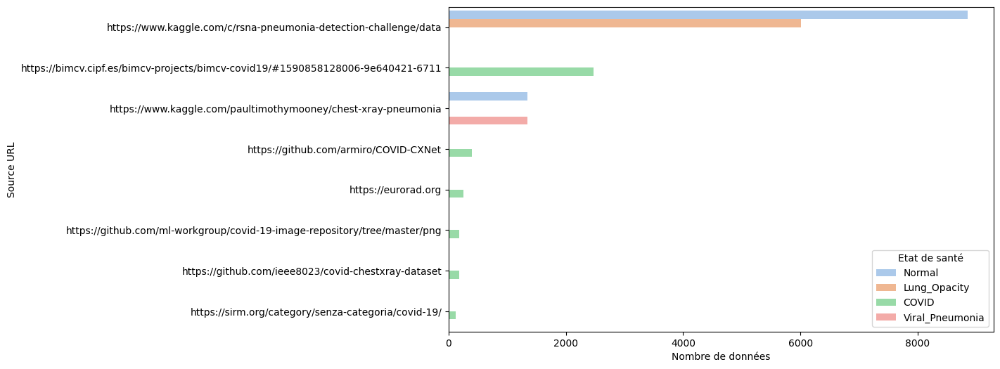

In [7]:
from matplotlib import pyplot as plt
import seaborn as sns

grouped = covid_ds_images.groupby(['source_url', 'health_status']).size().reset_index(name='counts')
grouped_sorted = grouped.sort_values(by='counts', ascending=False) # tri des données pour améliorer l'affichage
plt.figure(figsize=(10, 6))

sns.barplot(data=grouped_sorted, y='source_url', x='counts', hue='health_status', palette='pastel')
plt.xlabel('Nombre de données')
plt.ylabel('Source URL')
plt.legend(title='Etat de santé')

plt.show()

# Répartition des données en fonction de l"état de santé général

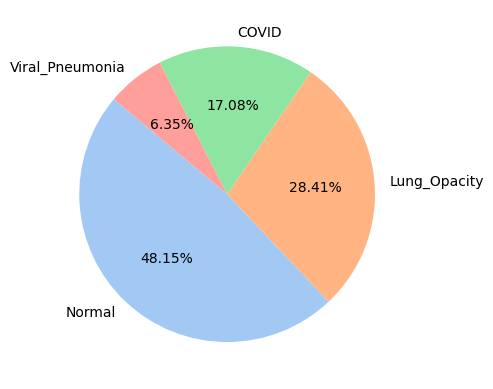

In [8]:
valeurs = covid_ds_images['health_status'].value_counts()
fig_b, ax = plt.subplots()
pastel = sns.color_palette("pastel")
ax.pie(valeurs, labels=valeurs.index, autopct='%1.2f%%', startangle=140,colors=pastel)
plt.show()

**Commentaire :**
- Dans les prochaines étapes du projet, nous devrons réduire le dataset pour obtenir une répartition équilibrée entre les différentes catégories (classe minimale).
- Près de 50% des patients "malades" souffrent de "Lung Opacity", ou opacité pulmonaire.


## Répartition des données en fonction de l"état de santé

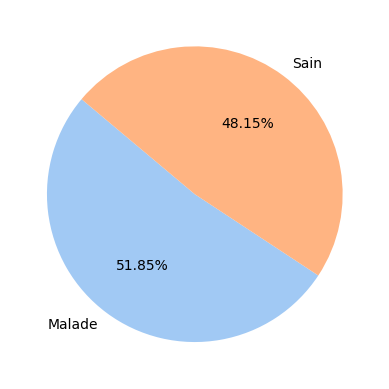

In [9]:
valeurs_sante = covid_ds_images['is_healthy'].value_counts()
pastel = sns.color_palette("pastel")
fig_c, ax = plt.subplots()
ax.pie(valeurs_sante, labels=valeurs_sante.index, autopct='%1.2f%%', startangle=140,colors=pastel)
plt.show()

**Commentaire :**
- Nous pouvons noter un léger déséquilibre entre le volume de données par patients sains et malades en faveur de la catégorie "malade".

# Représentation Graphique

## 1. Affichage d'images aléatoires du dataset et leurs masks


Répertoire  COVID



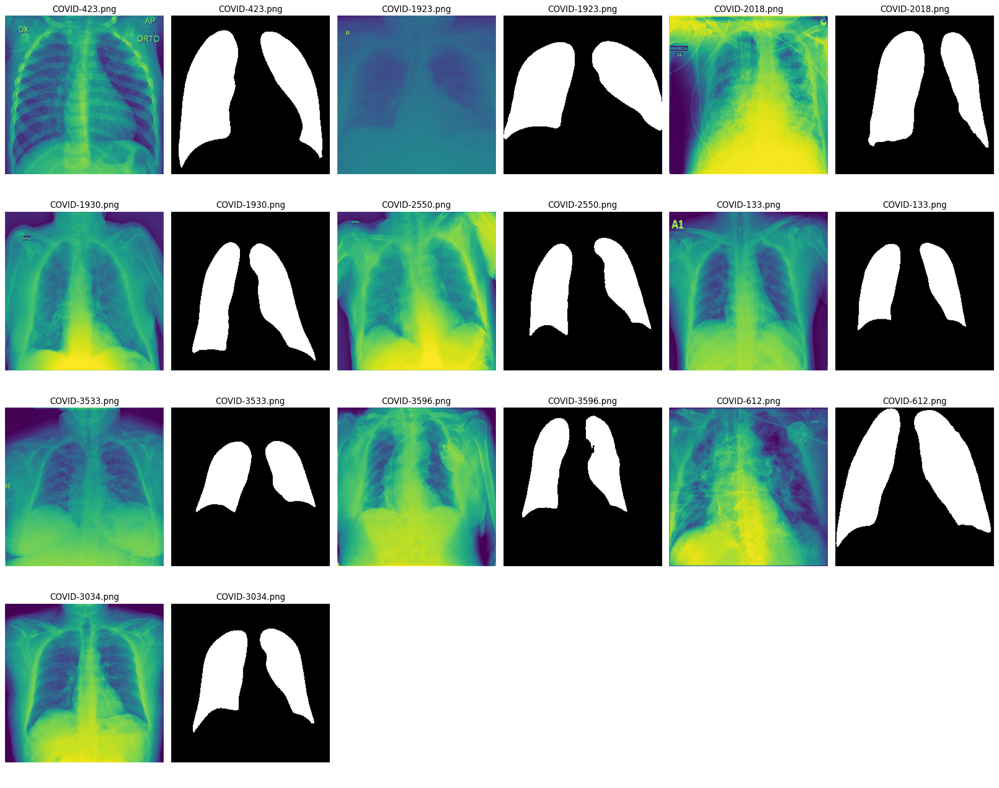


Répertoire  Lung_Opacity



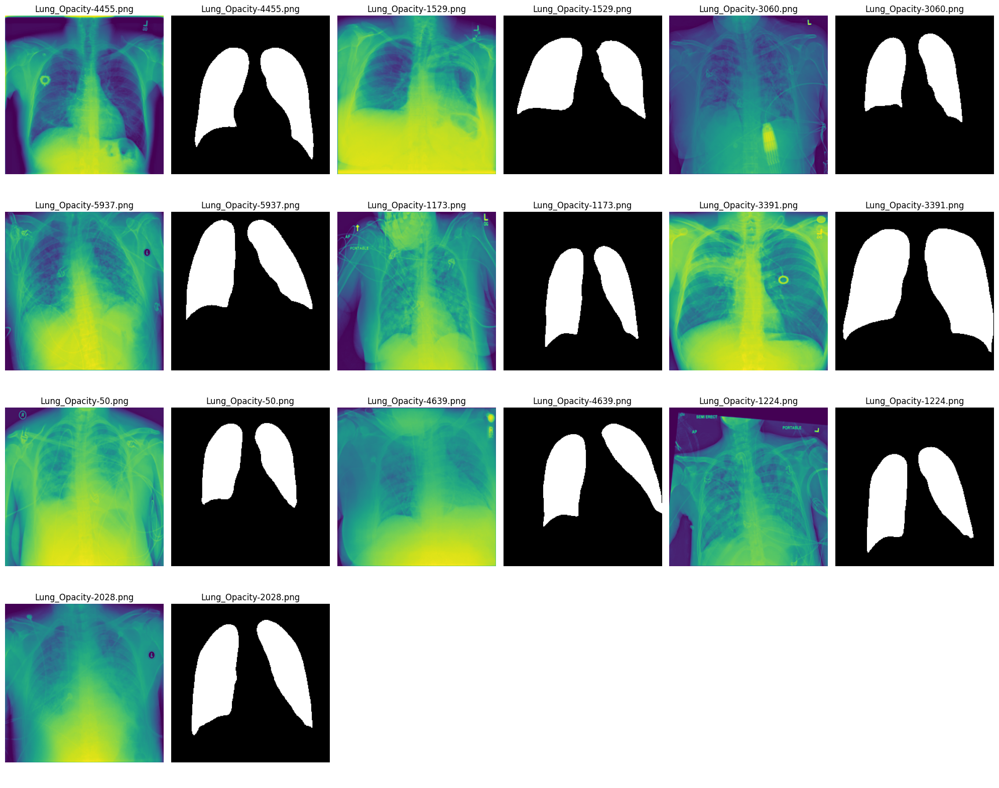


Répertoire  Normal



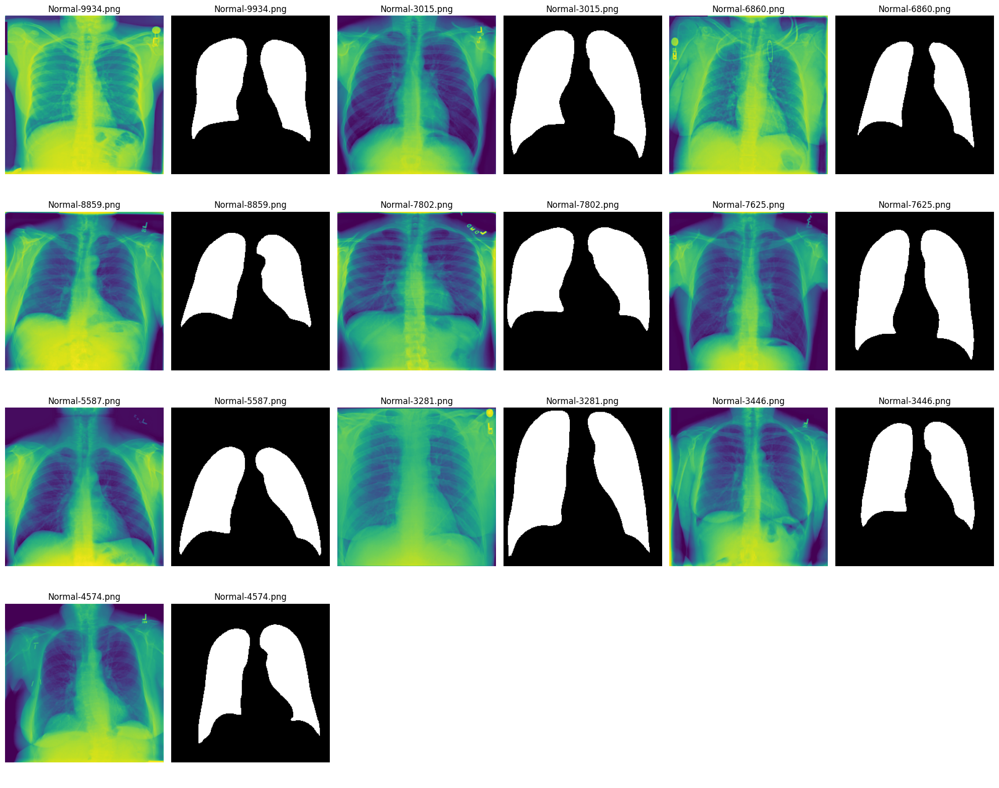


Répertoire  Viral_Pneumonia



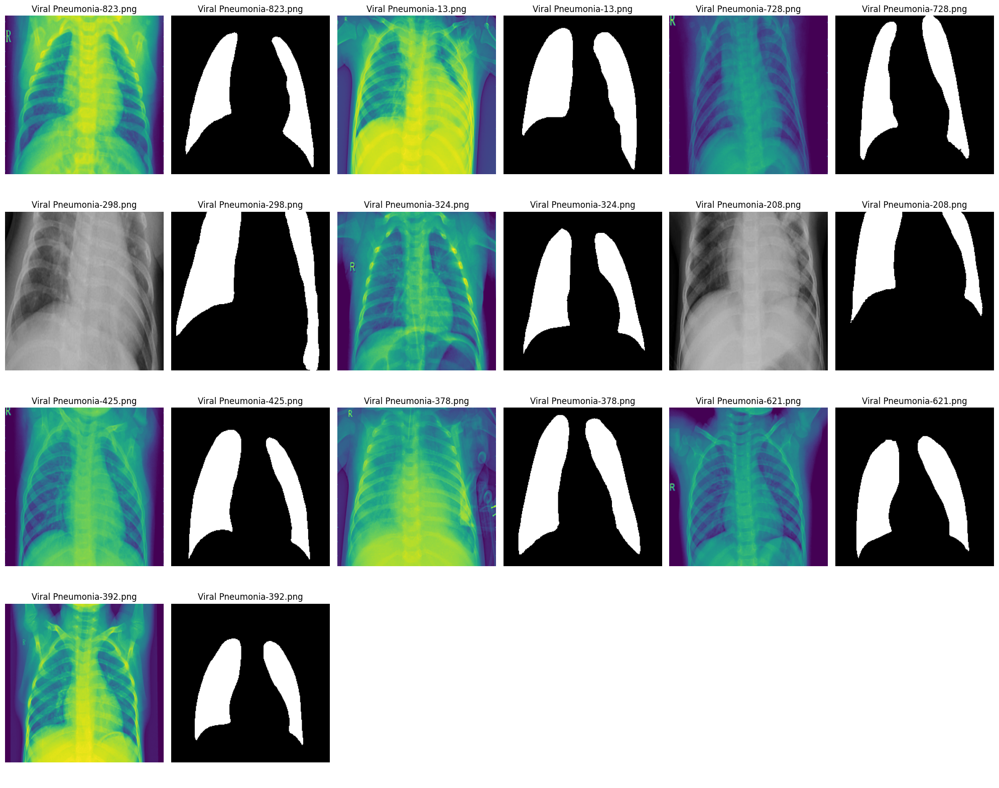

In [10]:
# Fonction d'affichage des images
def affichage_images(chemin_images):
    n_images = len(chemin_images)
    n_rows = np.ceil(n_images / 6).astype(int)  # Calcul du nombre de lignes nécessaires
    fig, axes = plt.subplots(n_rows, 6, figsize=(20, n_rows * 4))  # Ajuster la taille si nécessaire
    axes = axes.flatten()

    for i, image_path in enumerate(chemin_images):
        img = cv2.imread(str(image_path), cv2.IMREAD_UNCHANGED)
        axes[i].imshow(img)
        axes[i].axis('off')
        legende = os.path.basename(image_path)  # le nom du fichier est utilisé comme légende
        axes[i].set_title(legende)

    # Désactiver les axes supplémentaires si le nombre total d'images n'occupe pas tous les axes
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

## Fonction qui boucle sur les répertoires et leur applique l'affichage des images
for rep in repertoires:
  print()
  print("Répertoire ",rep)
  print()
  chemin_images=repertoire_dataset/rep/sous_rep_images
  chemin_masks=repertoire_dataset/rep/sous_rep_masks
  chemin_fichiers=[]
  for file in os.listdir(chemin_images):
    chemin_fichiers.append(chemin_images/file)
    chemin_fichiers.append(chemin_masks/file)
  affichage_images(chemin_fichiers)

**Commentaire :**
- Qualité des images (ex: COVID-1923.png, Viral Pneumonia-208)
- Présence d'artefacts
- Les images sont de dimensions 299*299.
- Les images masks sont de dimensions 256*256.
- Besoin de remettre toutes les images en niveau pour homogénéiser le dataset

## 2. Moyenne des images

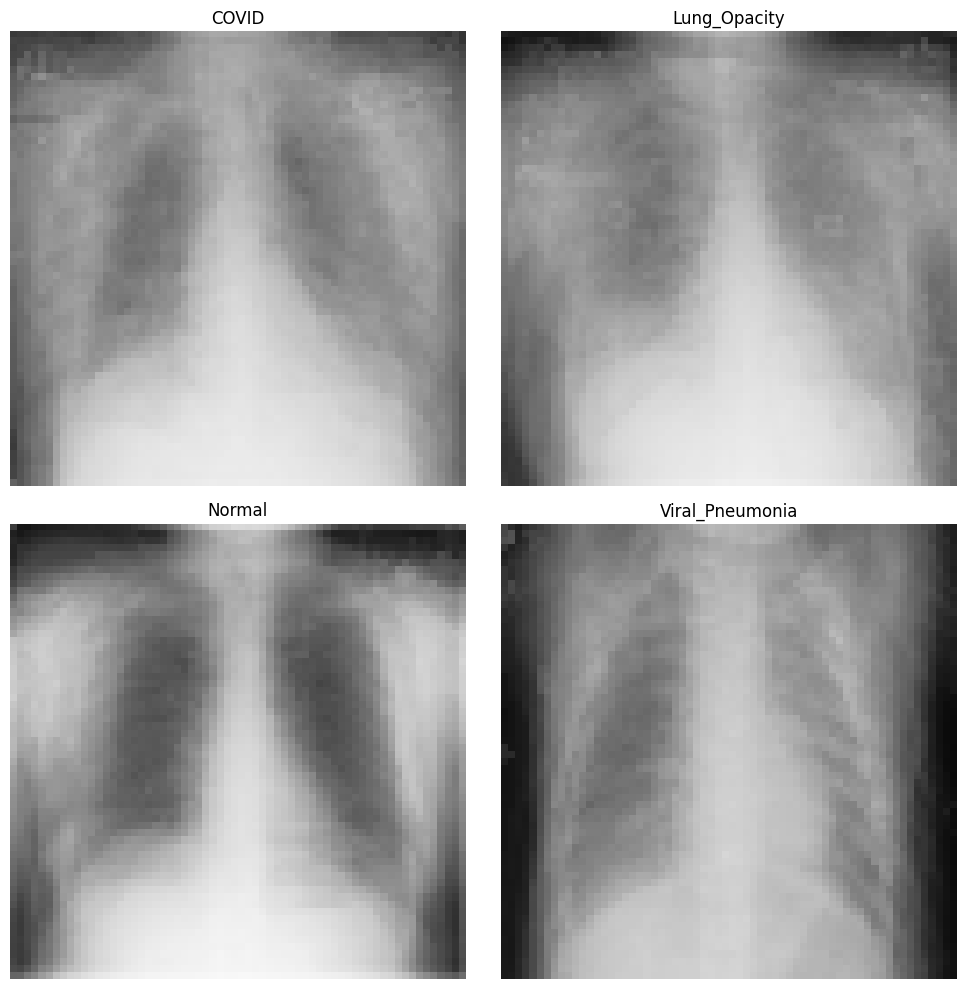

In [11]:
from tensorflow.keras.preprocessing import image
## Fonction de conversion d'une image en n m array
def img2np(list_of_filename, size = (64, 64)):
    # iterating through each file
    for fn in list_of_filename:
        current_image = image.load_img(fn, target_size = size,
                                       color_mode = 'grayscale')
        # covert image to a matrix
        img_ts = image.img_to_array(current_image)
        # turn that into a vector / 1D array
        img_ts = [img_ts.ravel()]
        try:
            # concatenate different images
            full_mat = np.concatenate((full_mat, img_ts))
        except UnboundLocalError:
            # if not assigned yet, assign one
            full_mat = img_ts
    return full_mat

## Fonction de calcul de la moyenne sur une liste de n m array
# application de la moyenne
def find_mean_img(full_mat, title, size = (64, 64)):
    mean_img = np.mean(full_mat, axis = 0)
    # reconvertir en matrice
    mean_img = mean_img.reshape(size)
    return mean_img
## Fonction d'affichage depuis des matrices et pas des chemins locaux
## prend une liste d'images à afficher: clé = nom du répertoire, valeur l'image moyenne
def affichage_images_matrice(liste_image_matrice):
    n_rows = int(len(liste_image_matrice)/2)
    fig, axes = plt.subplots(n_rows, 2, figsize=(10, n_rows * 5))
    axes = axes.flatten()

    current_ax = 0  # Indice pour suivre l'axe courant dans la grille
    for cle in liste_image_matrice.keys():
      if current_ax < len(axes):  # Vérifier pour éviter les erreurs d'index
          ax = axes[current_ax]
          im = ax.imshow(liste_image_matrice[cle], vmin=0, vmax=255, cmap='Greys_r')
          ax.set_title(f'{cle}')
          ax.axis('off')  # Masquer les axes pour une meilleure visibilité
          current_ax += 1

    # Désactiver les axes supplémentaires non utilisés
    for ax in axes[current_ax:]:
       ax.axis('off')

    plt.tight_layout()
    plt.show()

## Fonction qui boucle sur les répertoires et leur applique la conversion en matrice, puis la moyenne et l'affichage des images
mean_images={}
for rep in repertoires:
  chemin_images=repertoire_dataset/rep/sous_rep_images
  # on applique la conversion uniquement aux images originales et pas aux masques
  chemin_fichiers=[]
  for file in os.listdir(chemin_images):
    chemin_fichiers.append(chemin_images/file)
  n_m_images=img2np(chemin_fichiers)
  mean_image=find_mean_img(n_m_images, rep)
  mean_images[rep]=mean_image

affichage_images_matrice(mean_images)

**Commentaire :**
- Nous pouvons observer que sur l'image représentant les patients sains ("Normal"), l'intensité des noirs est plus prononcées au niveau des poumons. Autrement dit, les poumons sont plus visibles à l'oeil nu pour l'image "Normal" alors que pour les images des patients malades la coloration noir/gris est plus faible et les poumons se distinguent moins du reste du corps.

## 3. Médiane des images

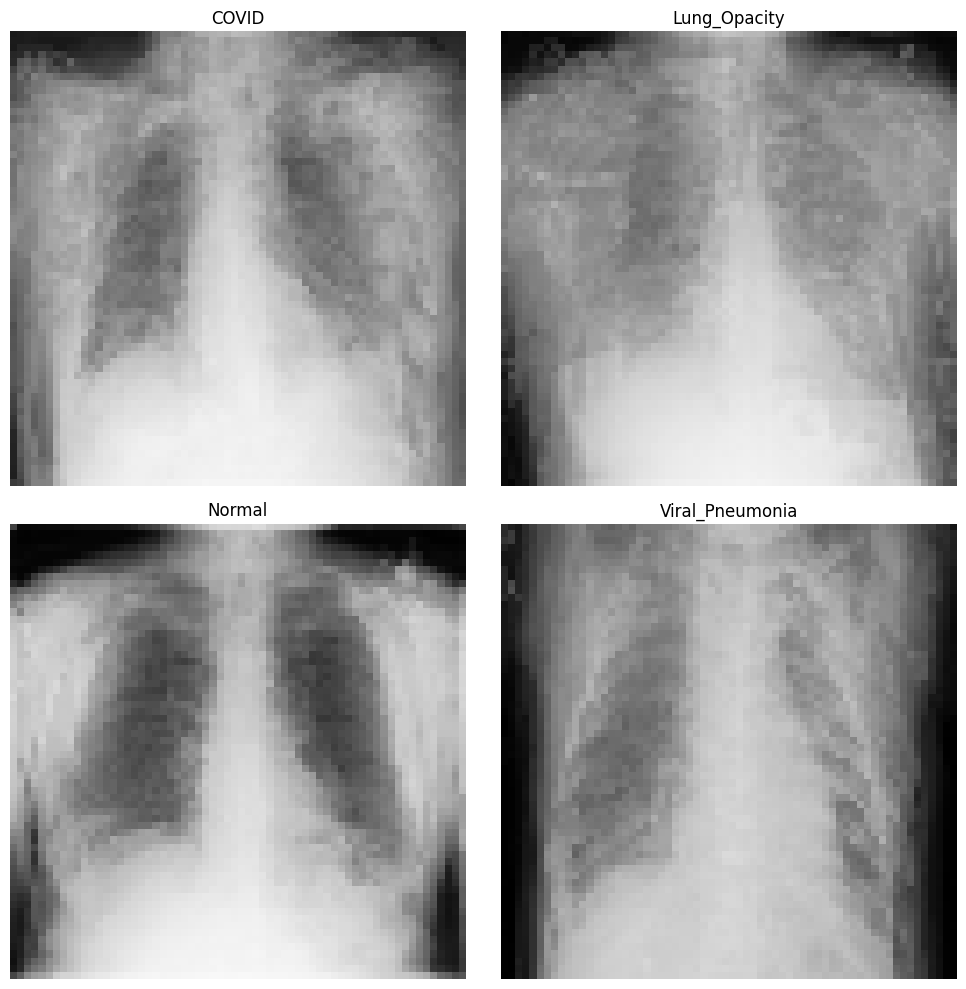

In [12]:
## Fonction de calcul de la moyenne sur une liste de n m array
# application de la moyenne
def find_median_img(full_mat, title, size = (64, 64)):
    median_img = np.median(full_mat, axis = 0)
    # reconvertir en matrice
    median_img = median_img.reshape(size)
    return median_img

## Fonction qui boucle sur les répertoires et leur applique la conversion en matrice, puis la mediane et l'affichage des images
median_images={}
for rep in repertoires:
  chemin_images=repertoire_dataset/rep/sous_rep_images
  # on applique la conversion uniquement aux images originales et pas aux masques
  chemin_fichiers=[]
  for file in os.listdir(chemin_images):
    chemin_fichiers.append(chemin_images/file)
  # conversion en np déjà faite
  n_m_images=img2np(chemin_fichiers)
  median_image=find_median_img(n_m_images, rep)
  median_images[rep]=median_image
affichage_images_matrice(median_images)

**Commentaire :**
- Même commentaire que ci-dessus à l'exception que dans les images "COVID" et "Viral_Pneumonia", les poumons ressortent un peu plus que pour la catégorie "Lung_Opacity".
- Nous pouvons synthétiser nos propos en soutenant que nous observons 3 niveaux d'intensité : 1. "Normal, 2. "COVID" et "Viral_pneumonia", 3. "Lung_Opacity".

## 4. Intensité moyenne des images

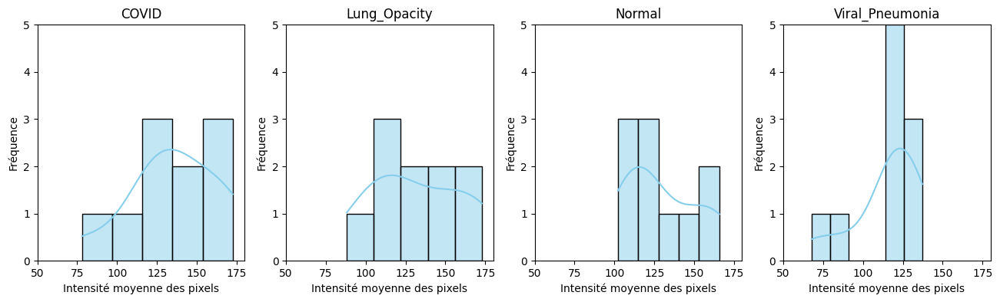

In [13]:
# fonction qui applique la moyenne aux images
# convertit les images en array
# leur applique la moyenne
# retourne la liste des intensités moyennes de toutes les images de la liste (et non la moyenne de la liste)
def intensite_moyenne(liste_images):
  intensites_moyennes=[]
  for chemin_image in liste_images:
    try:
        image = cv2.imread(str(chemin_image), cv2.IMREAD_UNCHANGED)
        intensites_moyennes.append(np.mean(np.array(image)))
    except Exception as e:
        print(f"Ignorer le fichier {image} : {e}")
  return intensites_moyennes

  # sous-plots
fig, axes = plt.subplots(1, len(repertoires), figsize=(16, 4))

mean_images={}
for i,rep in enumerate(repertoires):
  chemin_images=repertoire_dataset/rep/sous_rep_images
  # on applique la conversion uniquement aux images originales et pas aux masques
  chemin_fichiers=[]
  for file in os.listdir(chemin_images):
    chemin_fichiers.append(chemin_images/file)
  intensites_moyennes=intensite_moyenne(chemin_fichiers)
  # Le histplot avec courbe
  sns.histplot(intensites_moyennes, kde=True, ax=axes[i], color="skyblue")
  axes[i].set_title(rep)
  axes[i].set_xlabel('Intensité moyenne des pixels')
  axes[i].set_ylabel('Fréquence')
  axes[i].set_ylim(0, 5)
  axes[i].set_xlim(50, 180)


**Commentaire :**
- L'usage de cette méthode ne s'avère pas concluante sur un dataset aussi limité.
- Voyons ci-dessous si l'appliquer sur l'ensemble du dataset procure un résultat plus probant.

## 5. Intensité sur tout le dataset

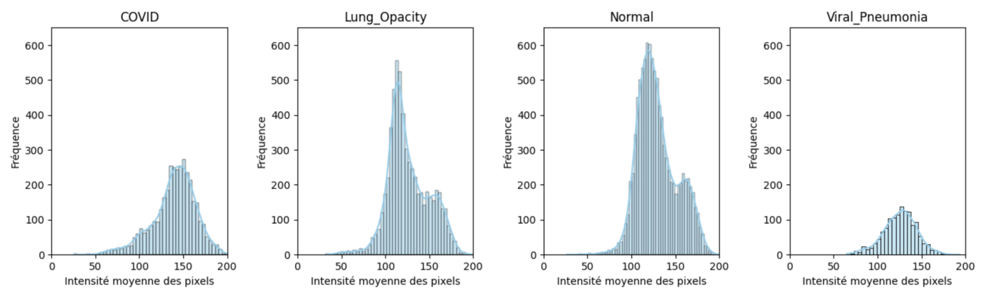

In [14]:
image = plt.imread(image_name)
plt.figure(figsize=(20, 20))
plt.imshow(image)
plt.axis('off')
plt.show()

**Commentaire :**
- Sur l'ensemble du dataset, cette méthode se montre plus probante puisque nous pouvons remarquer une similarité entre les courbes "Normal" et "Lung Opacity".
- Pour ces deux graphiques, nous observons un pic clair suivi néanmoins d'un rebond léger qui pourrait indiquer des zones de transition où le contraste est atténué.
- Pour les courbes "COVID" et "Viral_Pneumonia", les distributions sont équilibrées et les histogrammes sont plus ou moins symétriques autour de l'intensité moyenne.

## 6. Niveaux de gris

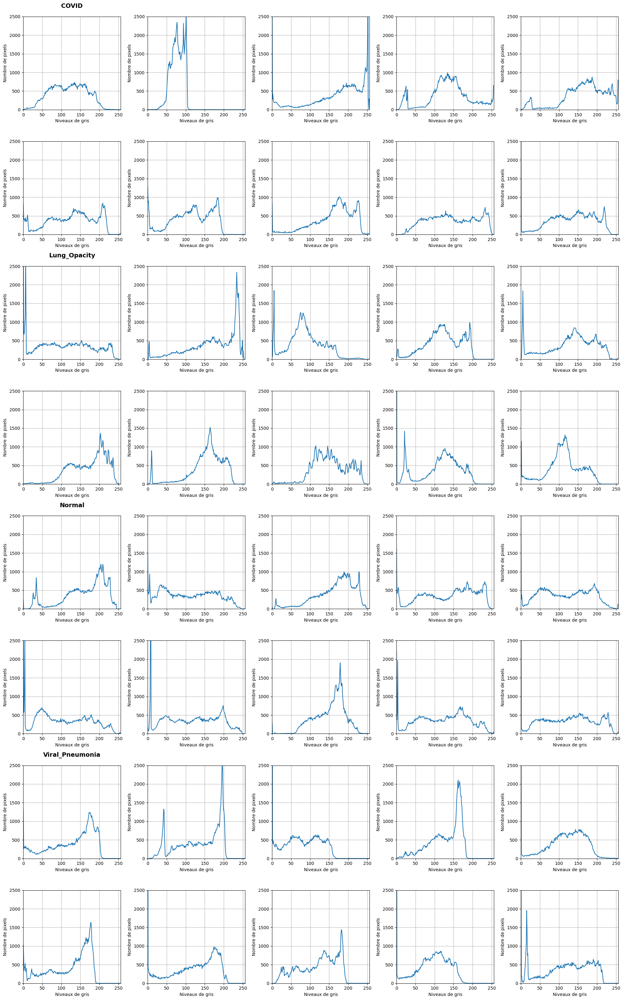

In [15]:
def plot_grayscale_histogram(chemin_image, ax):
    image = cv2.imread(chemin_image, cv2.IMREAD_GRAYSCALE)
    hist = cv2.calcHist([image], [0], None, [256], [0, 256])
    ax.plot(hist)
    ax.set_xlim([0, 256])
    ax.set_ylim(0, 2500)
    ax.axis('on')
    ax.set_xlabel("Niveaux de gris")
    ax.set_ylabel("Nombre de pixels")
    ax.grid(True)

# Calculer le nombre total d'images
n_images = sum(len(os.listdir(os.path.join(repertoire_dataset, d, sous_rep_images))) for d in repertoires)
# Calculer le nombre de lignes nécessaires, avec 5 graphiques par ligne
n_rows = (n_images + 4) // 5  # +4 pour arrondir au nombre supérieur si nécessaire
# Création de la figure avec un nombre dynamique de lignes
fig, axs = plt.subplots(n_rows, 5, figsize=(20, 4*n_rows), squeeze=False)

# Index pour parcourir les axes
ax_index = 0
nb_images=0
ax_y=0
for i,directory in enumerate(repertoires):
    full_path = os.path.join(repertoire_dataset, directory, sous_rep_images)
    files = [os.path.join(full_path, f) for f in os.listdir(full_path) if os.path.isfile(os.path.join(full_path, f))]
    axs[ax_y,0].set_title(directory, fontsize=14, weight='bold', pad=20)
    for file in files:
      if ax_index >= n_images:
        break  # Arrêter si on a affiché toutes les images prévues
      ax = axs[ax_index // 5, ax_index % 5]
      plot_grayscale_histogram(file, ax)
      ax_index += 1
      nb_images+= 1
    ax_y=int(nb_images / 5)

# Désactiver les axes inutilisés si le nombre d'images n'est pas un multiple de 5
for i in range(ax_index, n_rows*5):
    axs[i // 5, i % 5].axis('off')

plt.tight_layout()
plt.show()


**Commentaire :**
- Les graphiques des niveaux de gris ne sont pas concluants.

## 7. Conclusions sur les premières visualisations

A ce stade et après analyse, nous pouvons expérimenter une réalité découverte dans nos lectures, il est difficile, voire impossible, de faire un usage médical pertinent pour la détection du COVID-19 des radiographies tel qu'elles sont présentées dans le dataset. Cette impasse confirme l'intérêt de notre projet et le recours à des techniques plus avancées comme le deep learning.

### Preprocessing

In [16]:
#Importations
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go

from PIL import Image, ImageChops
import os
import random
from scipy.stats import f_oneway, levene, shapiro, kruskal
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from skimage import io, color, transform
from skimage.transform import resize
import shutil
from sklearn.pipeline import FeatureUnion
from sklearn.pipeline import Pipeline
import cv2



from sklearn.preprocessing import MinMaxScaler

In [17]:
# Dossiers contenant les images et les masques pour chaque catégorie

## on va utiliser le bloc en commun

# Nombre d'images à sélectionner par catégorie
images_per_category = 10

# Sélection aléatoire de 10 images de chaque catégorie
selected_image_mask_pairs = []

#for category, image_folder_path in image_folders.items():
for rep in repertoires:
    image_folder_path = str(repertoire_dataset)+"/"+rep+"/"+sous_rep_images
    mask_folder_path = str(repertoire_dataset)+"/"+rep+"/"+sous_rep_masks
    image_files = [os.path.join(image_folder_path, file) for file in os.listdir(image_folder_path)]
    mask_files = [os.path.join(mask_folder_path, file) for file in os.listdir(mask_folder_path)]

    # On trie les listes pour que l'image se retrouve avec le masque correspondant
    image_files.sort()
    mask_files.sort()

    selected_pairs = list(zip(image_files, mask_files))
    selected_image_mask_pairs.extend(selected_pairs)

In [18]:
selected_image_mask_pairs

[('SAMPLE_COVID-19_Radiography_Dataset/COVID/images/COVID-133.png',
  'SAMPLE_COVID-19_Radiography_Dataset/COVID/masks/COVID-133.png'),
 ('SAMPLE_COVID-19_Radiography_Dataset/COVID/images/COVID-1923.png',
  'SAMPLE_COVID-19_Radiography_Dataset/COVID/masks/COVID-1923.png'),
 ('SAMPLE_COVID-19_Radiography_Dataset/COVID/images/COVID-1930.png',
  'SAMPLE_COVID-19_Radiography_Dataset/COVID/masks/COVID-1930.png'),
 ('SAMPLE_COVID-19_Radiography_Dataset/COVID/images/COVID-2018.png',
  'SAMPLE_COVID-19_Radiography_Dataset/COVID/masks/COVID-2018.png'),
 ('SAMPLE_COVID-19_Radiography_Dataset/COVID/images/COVID-2550.png',
  'SAMPLE_COVID-19_Radiography_Dataset/COVID/masks/COVID-2550.png'),
 ('SAMPLE_COVID-19_Radiography_Dataset/COVID/images/COVID-3034.png',
  'SAMPLE_COVID-19_Radiography_Dataset/COVID/masks/COVID-3034.png'),
 ('SAMPLE_COVID-19_Radiography_Dataset/COVID/images/COVID-3533.png',
  'SAMPLE_COVID-19_Radiography_Dataset/COVID/masks/COVID-3533.png'),
 ('SAMPLE_COVID-19_Radiography_Datas

In [19]:
#On définit une classe ImgageMaskProcessor qui va servir à créer un pipeline de preprocessing
class ImageMaskProcessor(BaseEstimator, TransformerMixin):
    def __init__(self, target_size=(299, 299)):
        self.target_size = target_size

    def fit(self, X, y=None):
        return self

    def transform(self, selected_image_mask_pairs):
        preprocessed_images = []
        preprocessed_masks = []

        for image_path, mask_path in selected_image_mask_pairs:
            # Charger l'image en niveaux de gris
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            # Redimensionner l'image à la taille spécifiée
            image = cv2.resize(image, self.target_size)
            # Normaliser les valeurs de pixel entre 0 et 1
            image = image.astype(np.float32) / 255.0
            # Ajouter un canal pour obtenir une forme (299, 299, 1)
            image = np.expand_dims(image, axis=-1)
            preprocessed_images.append(image)

            # Charger le masque en couleur (RGB)
            mask = cv2.imread(mask_path)
            # Redimensionner le masque à la taille spécifiée
            mask = cv2.resize(mask, self.target_size)
            # Convertir le masque en niveaux de gris
            mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
            # Normaliser les valeurs de pixel entre 0 et 1
            mask = mask.astype(np.float32) / 255.0
            # Ajouter un canal pour obtenir une forme (299, 299, 1)
            mask = np.expand_dims(mask, axis=-1)
            # Répéter le masque sur trois canaux pour correspondre aux images
            mask = np.repeat(mask, 3, axis=-1)
            preprocessed_masks.append(mask)

        return np.array(preprocessed_images), np.array(preprocessed_masks)

In [20]:
#Création du pipeline et application de celui-ci
image_mask_processor_pipeline = Pipeline([
    ('process_images_masks', ImageMaskProcessor())
])

preprocessed_images, preprocessed_masks = image_mask_processor_pipeline.transform(selected_image_mask_pairs)

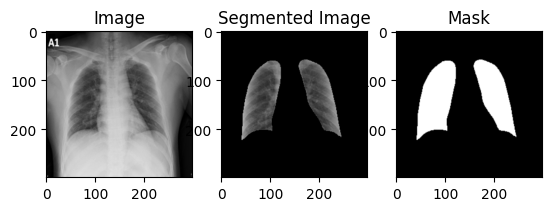

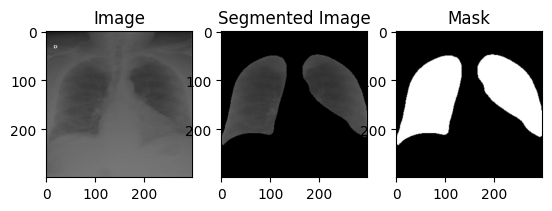

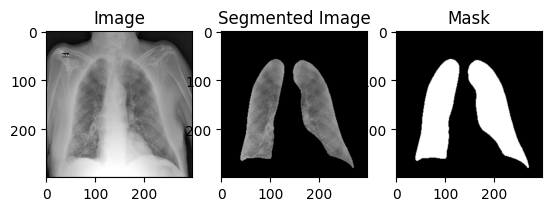

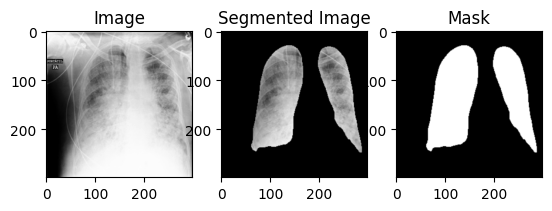

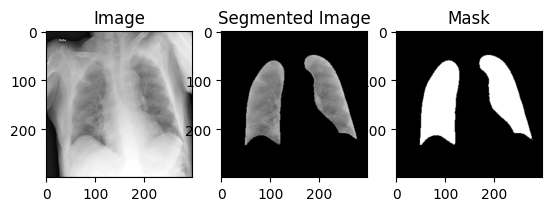

...

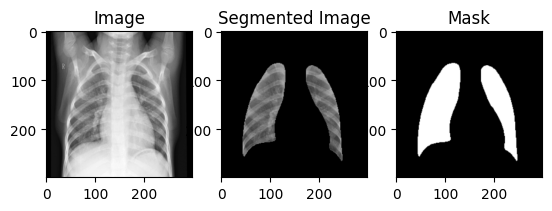

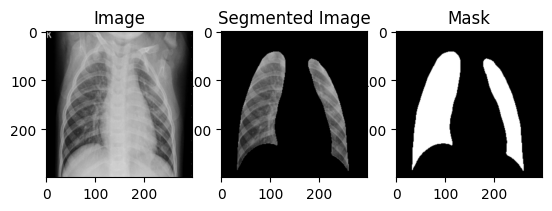

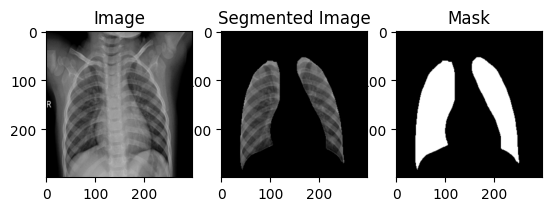

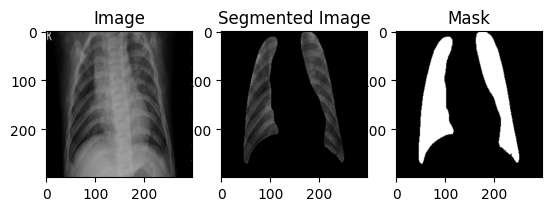

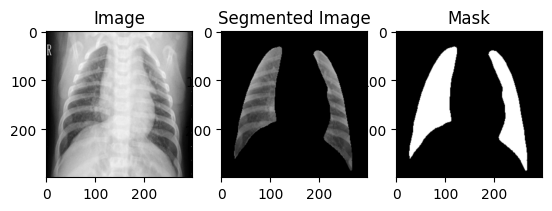

In [21]:
# Afficher les images segmentées
for i in range(len(preprocessed_images)):
    segmented_image = preprocessed_masks[i] * preprocessed_images[i]
    plt.subplot(1, 3, 1)
    plt.imshow(preprocessed_images[i],cmap='gray')
    plt.title('Image')

    plt.subplot(1, 3, 2)
    plt.imshow(segmented_image, cmap='gray')
    plt.title('Segmented Image')

    plt.subplot(1, 3, 3)
    plt.imshow(preprocessed_masks[i])
    plt.title('Mask')

    plt.show()